In [1]:
%matplotlib inline


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.io import imread
import mpld3
mpld3.enable_notebook()
from scipy.ndimage import convolve

mpld3 librari enables zooming of the picture
mpld3.enable_notebook() enables the jupyter notebook to allow it.

One of the easiest way to open a picture is using scikit image

In [3]:
tiger = imread('data/tiger.jpg')

The picture is represented as a 3D table. The first 2 dimensions are for the pixel coordinates (0, 0 is always at thhe upper left corner of the screen). Very often we reduce the number of dimentions to optimise the processes.

In [4]:
tiger.shape

(600, 580, 3)

An ndarray is a (usually fixed-size) multidimensional container of items of the same type and size. 
The number of dimensions and items in an array is defined by its shape, which is a tuple of N non-negative integers 
that specify the sizes of each dimension. 
The type of items in the array is specified by a separate data-type object (dtype), 
one of which is associated with each ndarray. As with other container objects in Python, 
the contents of an ndarray can be accessed and modified by indexing or slicing the array (using, for example, N integers), 
and via the methods and attributes of the ndarray.

In [5]:
type(tiger)

numpy.ndarray

<function matplotlib.pyplot.show(close=None, block=None)>

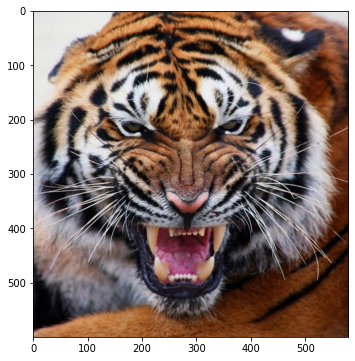

In [6]:
plt.figure(figsize = (6, 6)) # set the figure size
plt.imshow(tiger) # Displaying the image
plt.show

In [7]:
tiger[0, 0]

array([223, 224, 226], dtype=uint8)

Most image processing algorithms are easier to understand on grayscale images so we can do slicing (the 3rd dimension is the rgb colour (if the picture is jpg)

In [8]:
tiger_r = tiger[:,:,0]
tiger_g = tiger[:,:,1]
tiger_b = tiger[:,:,2]

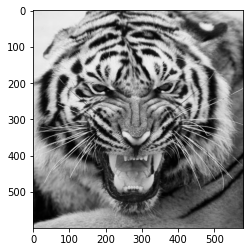

In [9]:
plt.imshow(tiger_r, cmap = 'gray') #cmap make the picture grayscale
plt.show()

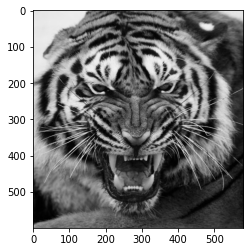

In [10]:
plt.imshow(tiger_g, cmap = 'gray') 
plt.show()

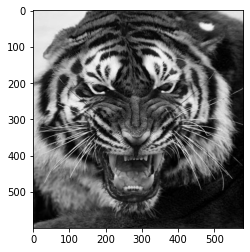

In [11]:
plt.imshow(tiger_b, cmap = 'gray') 
plt.show()

Image Histogram
as usual, histograms tell us how the values are distributed:
- How many dark values, how many light values
- Maximum brightness, peaks, etc.

Histograms need to have a single variable, so when we take each channel separately (e.g. red) we still have 2D matrix, which we
need to convert to 1D array: image.ravel()
    
Show the histogram as usual. It’s common to use 256 bins, because in rgb jpeg we have 8 bit colours (0-255 included).

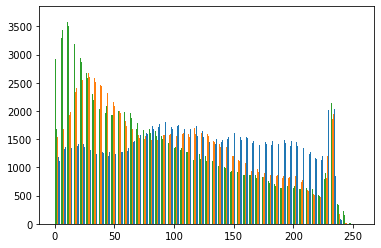

In [12]:
plt.hist([tiger_r.ravel(),  tiger_g.ravel(),  tiger_b.ravel()], bins = 256)
plt.show()

Plotting 3 histograms on one plot using Matplotlib displays 3 histograms on one set of axes.
Call matplotlib.pyplot.hist(x) with x as a list of data sets to plot a histogram for each data set in x on the same plot.

plt.hist([dataset1, dataset2, dataset3])

Converting to Grayscale
Sometimes working per channel is not necessary. We can combine all three channels and get a grayscale image.
Simplest way: get the mean of all values

In [13]:
tiger_r.mean(), tiger_g.mean(), tiger_b.mean()

(120.53295689655172, 97.3193132183908, 87.46683045977011)

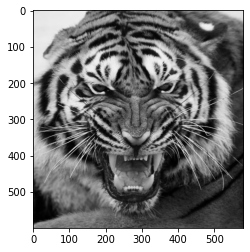

In [14]:
tiger_grayscale_1 = np.mean(tiger , axis = 2)
plt.imshow(tiger_grayscale_1, cmap='gray')
plt.show()

Better way: use coefficients for each channel. The human eye discerns colors differently - we’re more sensitive to green colors. Luma coding in video systems - for images in colour spaces such as Y'UV and its relatives, which are used in standard colour TV and video systems such as PAL, SECAM, and NTSC, a nonlinear luma component (Y') is calculated directly from gamma-compressed primary intensities as a weighted sum, which, although not a perfect representation of the colourimetric luminance, can be calculated more quickly without the gamma expansion and compression used in photometric/colourimetric calculations.


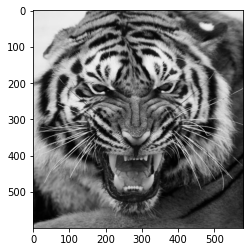

In [15]:
tiger_grayscale = 0.299 * tiger_r + 0.587 * tiger_g + 0.114 * tiger_b
plt.imshow(tiger_grayscale, cmap='gray')
plt.show()

Convolution - in mathematics (in particular, functional analysis), convolution is a mathematical operation on two functions that produces a third function () that expresses how the shape of one is modified by the other. The term convolution refers to both the result function and to the process of computing it.


In [16]:
size = 5
conv_filter = np.ones((size, size)) / (size * size)
blurred = convolve(tiger_grayscale, conv_filter)

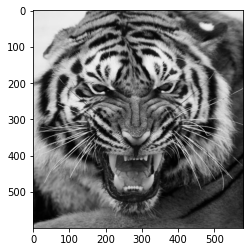

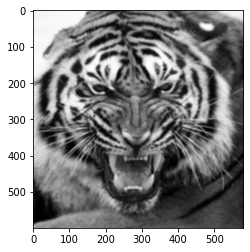

In [17]:
plt.imshow(tiger_grayscale, cmap='gray')
plt.show()
plt.imshow(blurred, cmap='gray')
plt.show()

Transform the image from grayscale to black and white one

In [22]:
tiger_binary = tiger_grayscale.copy()

threshold = 170
tiger_binary[tiger_binary <= threshold] = 0
tiger_binary[tiger_binary > threshold] = 255

In [23]:
tiger_binary

array([[255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       ...,
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   0.,   0.,   0.]])

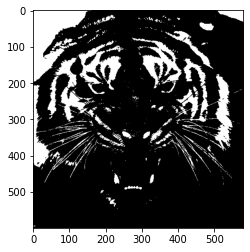

In [24]:
plt.imshow(tiger_binary, cmap='gray')
plt.show()